<a href="https://colab.research.google.com/github/arfianaja/yolov5_train/blob/main/gita_kursi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

install requirements

In [3]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16725, done.
remote: Counting objects: 100% (266/266), done.
remote: Compressing objects: 100% (196/196), done.
remote: Total 16725 (delta 139), reused 148 (delta 70), pack-reused 16459
Receiving objects: 100% (16725/16725), 15.40 MiB | 15.20 MiB/s, done.
Resolving deltas: 100% (11438/11438), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.7/793.7 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 64.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the fo

In [1]:
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.2/76.2 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.4 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0


In [5]:
#follow the link below to get your download code from from Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="", model_format="yolov5", notebook="roboflow-yolov5")

In [4]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

masukkan kode dari roboflow


In [6]:
%cd /content/yolov5
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="")
project = rf.workspace("universitas-muhammadiyah-sorong").project("kursi-p5amc")
version = project.version(11)
dataset = version.download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/kursi-11 in yolov5pytorch:: 100%|██████████| 570/570 [00:00<00:00, 8238.55it/s]


Train Our Custom YOLOv5 model
Here, we are able to pass a number of arguments:

img: menentukan ukuran gambar masukan

batch: menentukan ukuran batch

epochs: menentukan jumlah periode pelatihan. (Catatan: sering kali, 3000+ adalah umum di sini!)

data: Lokasi dataset kami disimpan di dataset.location

weights: tentukan jalur ke bobot untuk memulai transfer pembelajaran. Di sini kami memilih pos pemeriksaan pretrained COCO umum.

cache: gambar cache untuk pelatihan lebih cepat

In [7]:
!python train.py --img 416 --batch 32 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --name yolov5s_results

2024-07-03 21:47:30.901944: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-03 21:47:30.901995: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-03 21:47:30.974483: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/kursi-11/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=Fal

** Evaluasi Performa Detektor YOLOv5 Khusus Kerugian pelatihan dan metrik kinerja disimpan ke Tensorboard dan juga ke file log.**

**If you are new to these metrics, the one you want to focus on is mAP_0.5 - learn more about mean average precision here.**


In [8]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [9]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/datasets/kursi-11/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-334-g100a423b Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/42 /content/datasets/kursi-11/test/images/WhatsApp-Image-2023-08-22-at-00-35-16-2-_jpeg.rf.81929a0e6902b350bcd0d22b1e6edd26.jpg: 416x416 5 Kursi_Kosongs, 5 Kursi_Terisis, 7.1ms
image 2/42 /content/datasets/kursi-11/test/images/WhatsApp-Image-2023-08

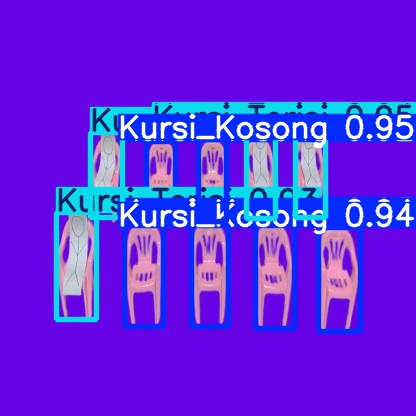

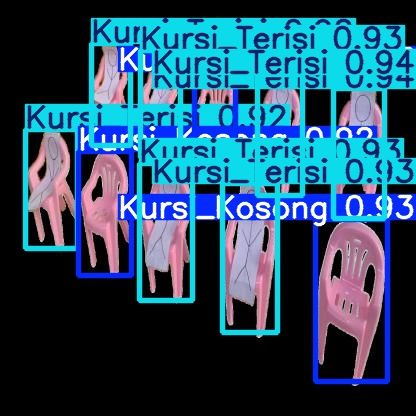

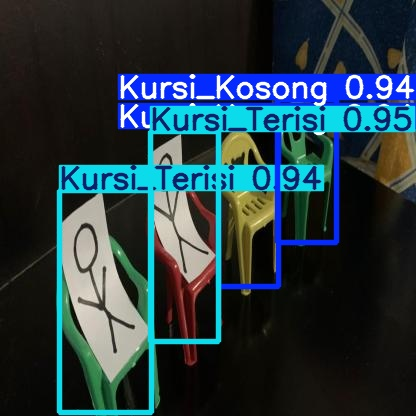

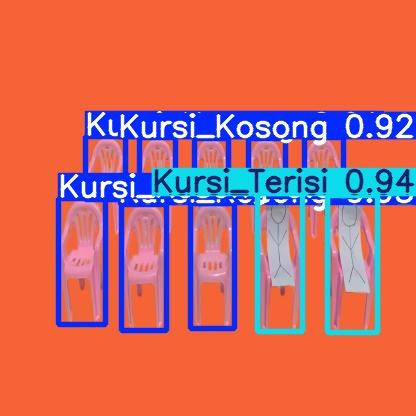

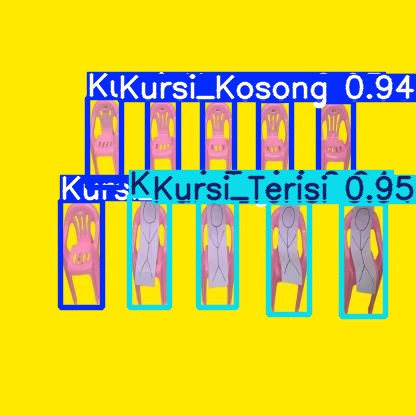

...

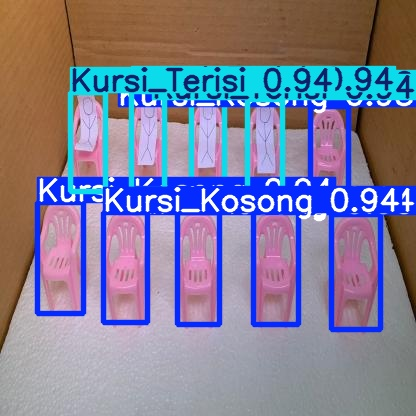

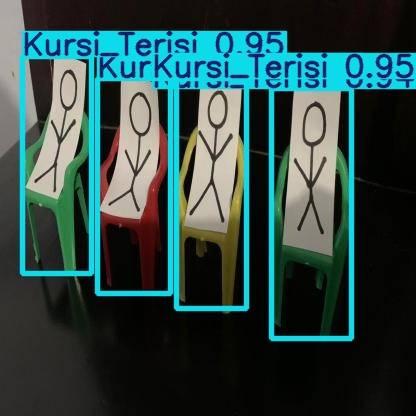

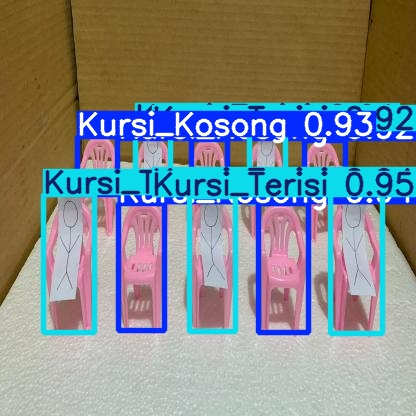

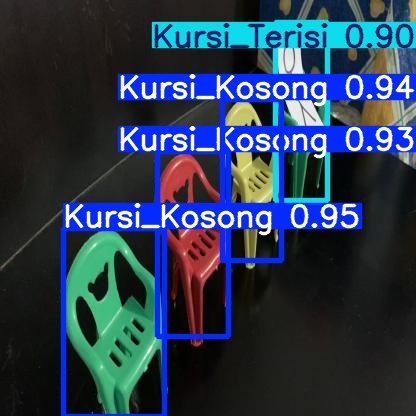

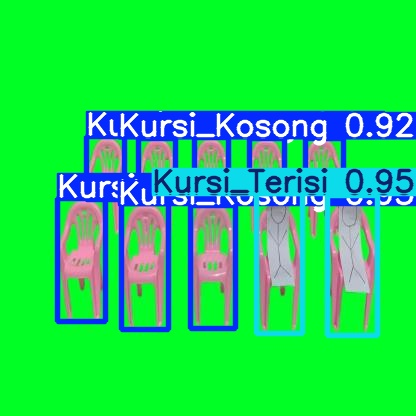

In [10]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [11]:
!python val.py --weights runs/train/yolov5s_results/weights/best.pt --data /content/datasets/kursi-11/data.yaml --img 416 --iou 0.65 --half

val: data=/content/datasets/kursi-11/data.yaml, weights=['runs/train/yolov5s_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-334-g100a423b Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/datasets/kursi-11/valid/labels.cache... 42 images, 0 backgrounds, 0 corrupt: 100% 42/42 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 2/2 [00:03<00:00,  1.70s/it]
                   all         42        246      0.999          1      0.995      0.847
          Kursi_Kosong         42        118      0.999          1      0.995      0.858
 

In [12]:
!ls runs/train/yolov5s_results

confusion_matrix.png				    opt.yaml	  train_batch0.jpg
events.out.tfevents.1720043254.d3cbd246cb09.2018.0  P_curve.png   train_batch1.jpg
F1_curve.png					    PR_curve.png  train_batch2.jpg
hyp.yaml					    R_curve.png   val_batch0_labels.jpg
labels_correlogram.jpg				    results.csv   val_batch0_pred.jpg
labels.jpg					    results.png   weights


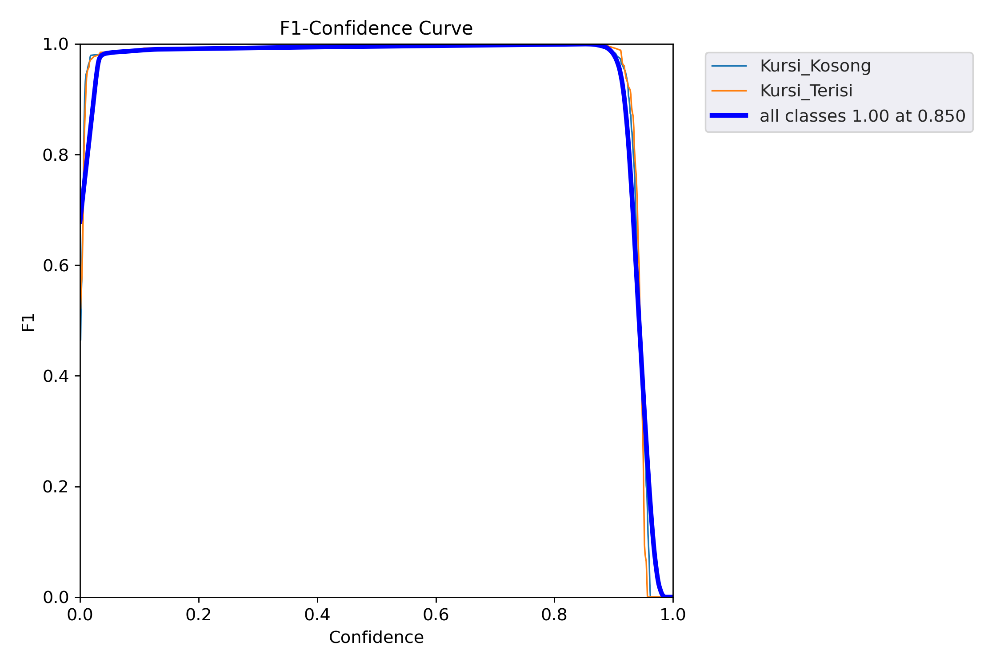

In [13]:
from utils.plots import plot_results
Image(filename='runs/train/yolov5s_results/F1_curve.png', width=1000)

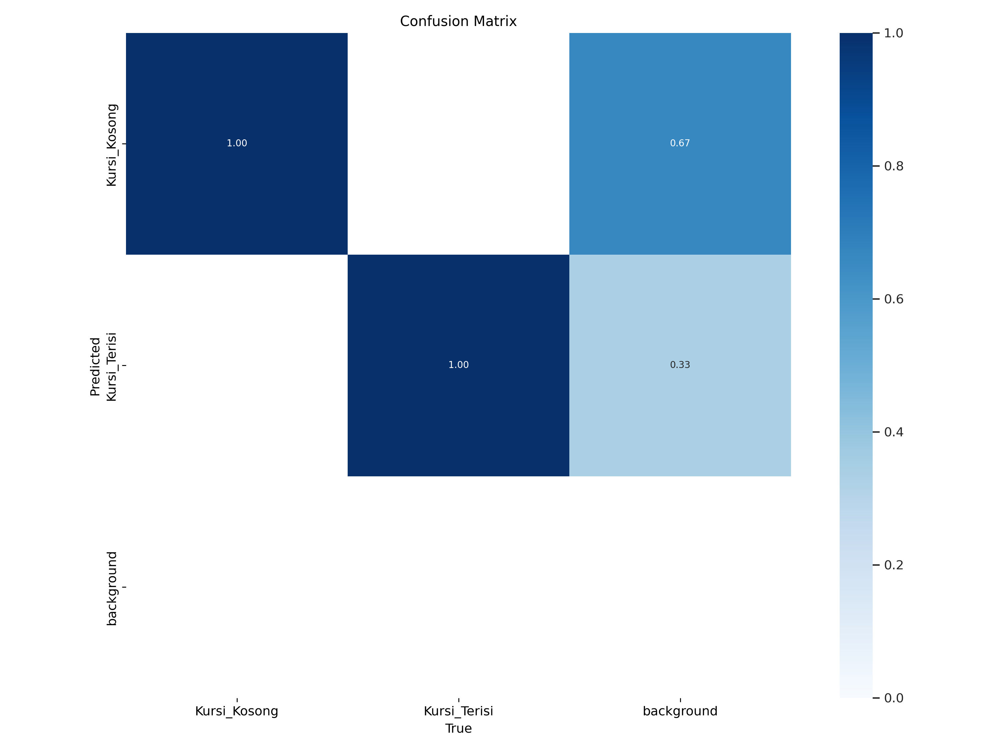

In [14]:
from utils.plots import plot_results
Image(filename='runs/train/yolov5s_results/confusion_matrix.png', width=1000)

In [ ]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source /content/T.png

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/T.png, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /usr/local/lib/python3.10/dist-packages/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-167-g5deff14 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7107217 parameters, 0 gradients, 16.1 GFLOPs
image 1/1 /content/T.png: 416x288 1 T, 44.8ms
Speed: 0.3ms pre-process, 44.8ms inference, 93.3ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp5


In [21]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/P_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [22]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/PR_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [23]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/confusion_matrix.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [24]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/R_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [25]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/F1_curve.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [26]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>